This code has the comparison to the gaussian beams that I did at some point

In [1]:
import os
from astropy.io import fits
import pandas as pd
from astropy import modeling
import numpy as np
import matplotlib as mpl
from matplotlib import gridspec
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.interpolate import RectBivariateSpline
from reproject import reproject_interp
from astropy.wcs import WCS

mpl.rcParams['font.family'] = 'serif'
%matplotlib inline
mpl.rcParams['font.size'] = '12'
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

In [2]:
#freq_label = np.array([1234867750.0, 1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0, 1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0])
#freq_label_gh = np.round(freq_label/1e9,2)

freq_label = []
CRVAL3_new = 1280e6+(12.207e3*(-(24576/2-14000)))  #rewrite to this
CDELT3_new = 12.207e3*1050
for i in range(0,10):
    freq_label.append(CRVAL3_new+(i*CDELT3_new))
    
freq_label_gh = np.round(np.array(freq_label)/1e9,2)

# Plot individual beams (from large map)

In [8]:

def plot_full_field_v2(date, beam, source, pol):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_{}.fits'.format(date, source, date, beam, pol))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,5))
    plt.title('CB{} {}'.format(beam, pol))
    plt.axis("off")

    for i in range(10):
        ax = fig.add_subplot(2,5,i+1) #,projection=WCS(header, naxis=2))
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.05)
        #plt.contour(data[i,:,:], lev=[0.01, 0.02], colors='w')
        ax.set_title('{} GHz'.format(freq_label_gh[i]), fontsize=16)
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18)
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_{}.png'.format(date, beam, pol), bbox_inches="tight", dpi=200)

#plot_full_field_v2('200430', 0)


In [4]:
# same as above, but for the new frequency setting withm more frequency bins (18)

def plot_full_field_v3(date, beam, source, chan):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_I.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,10))
    plt.title('CB{} I'.format(beam))
    plt.axis("off")

    for i in range(chan):
        ax = fig.add_subplot(4,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.05)
        #plt.contour(data[i,:,:], lev=[0.01, 0.02], colors='w')
        ax.set_title('{} GHz'.format(freq_label_gh[i]), fontsize=18)
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18)
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_v2.png'.format(date, beam), bbox_inches="tight", dpi=200)

#plot_full_field_v2('200430', 0)


/home/apercal/pipeline/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


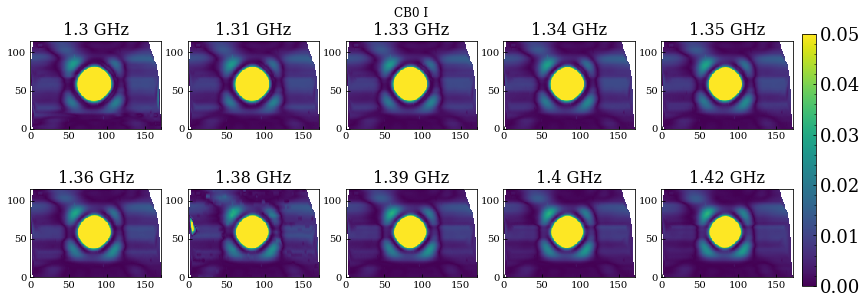

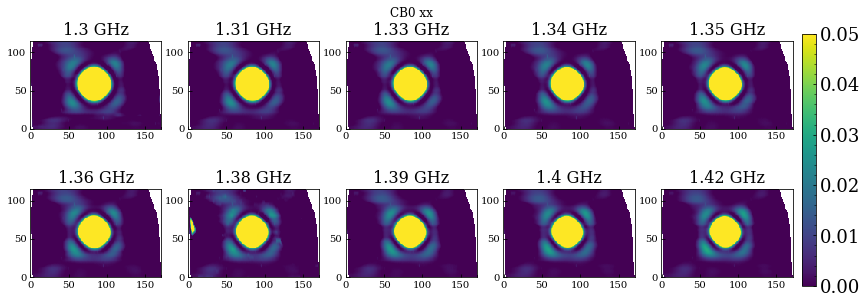

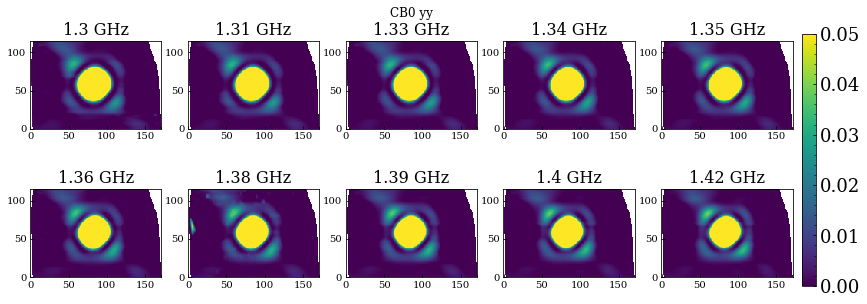

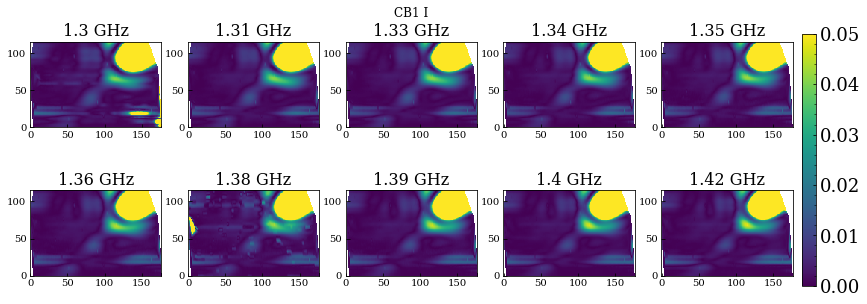

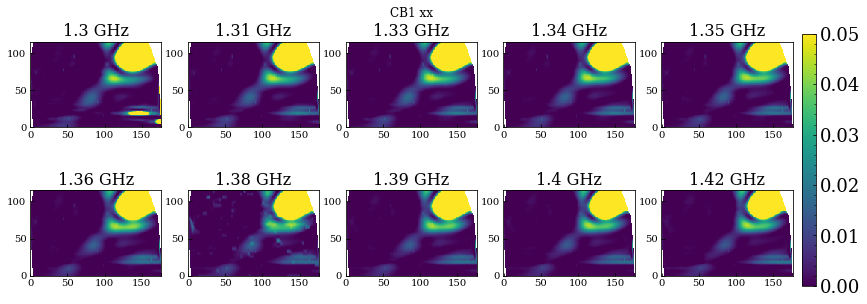

...

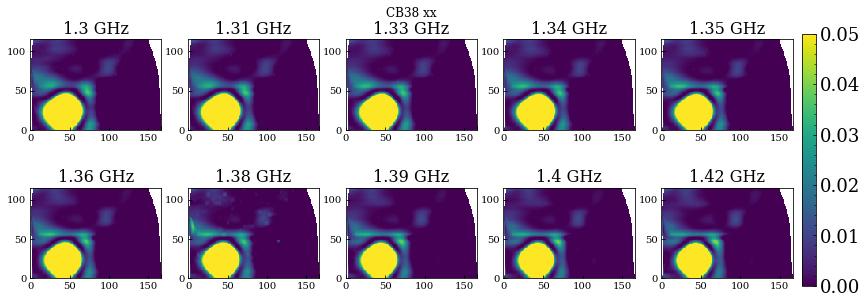

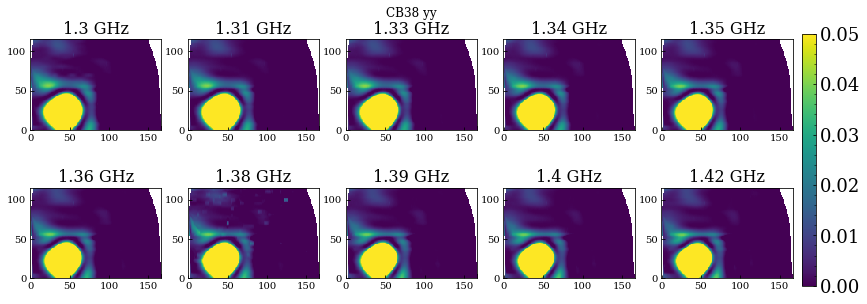

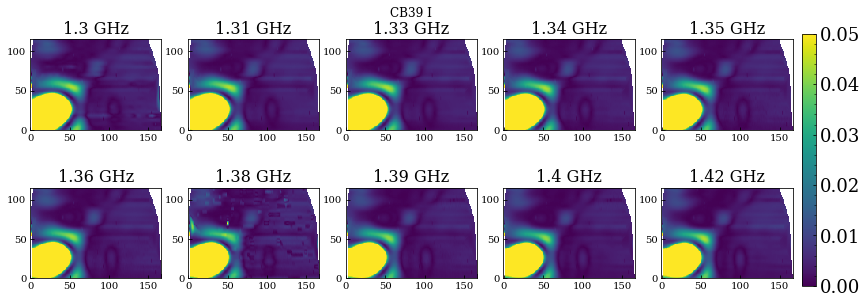

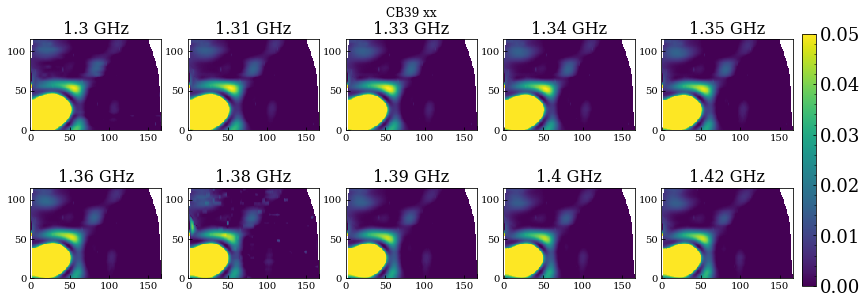

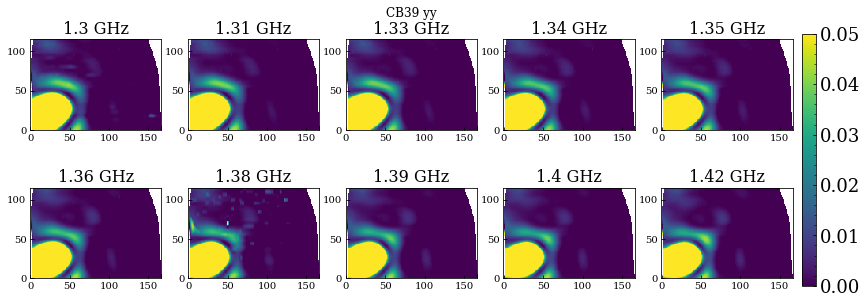

In [9]:
# 200430, 201028, 190821

for j in range(40):
#     plot_full_field_v2('210205', j, 'CygA', 'I')
#     plot_full_field_v2('210205', j, 'CygA', 'xx')
#     plot_full_field_v2('210205', j, 'CygA', 'yy')
    #plot_full_field_v3('210205', j, 'CygA')
    #plot_full_field_v2('200430', j, 'CygA', 'I')
#     plot_full_field_v2('200430', j, 'CygA', 'xx')
#     plot_full_field_v2('200430', j, 'CygA', 'yy')
    plot_full_field_v2('201028', j, 'CasA', 'I')
    plot_full_field_v2('201028', j, 'CasA', 'xx')
    plot_full_field_v2('201028', j, 'CasA', 'yy')
#     plot_full_field_v2('190821', j, 'CygA', 'I')
#     plot_full_field_v2('190821', j, 'CygA', 'xx')
#     plot_full_field_v2('190821', j, 'CygA', 'yy')
    
    #plot_full_field_v3('210402', j, 'CasA', 18)
    

# Average frequency

In [ ]:

def plot_full_field_bin(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_I.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    print(data.shape[0])

    fig = plt.figure(figsize=(13,10))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")
    data_2 = np.zeros((data.shape[1], data.shape[2]))

    for i in range(1,13):
        data_2 = data_2 + data[i,:,:]
        
    ax = fig.add_subplot(1,1,1)
    cb = plt.imshow(data_2/12, vmin=0, vmax=0.02)
    #plt.contour(data[i,:,:], lev=[0.01, 0.02], colors='w')
    ax.set_title('Chan '+str(i).zfill(2))
    plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18)
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_bin.png'.format(date, beam), bbox_inches="tight", dpi=200)

plot_full_field_bin('210205', 33, 'CygA')


In [ ]:

def plot_full_field(date, beam):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/CygA_{}_{:02}_I.fits'.format(date, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,5))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(10):
        ax = fig.add_subplot(2,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=1)
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}.png'.format(date, beam), bbox_inches="tight", dpi=200)

plot_full_field('200430', 0)


In [ ]:

def plot_full_field_xx(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_xx.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,5))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(10):
        ax = fig.add_subplot(2,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.1)
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_xx.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [8]:

def plot_full_field_xx_v2(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_xx.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,10))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(18):
        ax = fig.add_subplot(4,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.1)
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_xx.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [ ]:

def plot_full_field_yy(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_yy.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,5))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(10):
        ax = fig.add_subplot(2,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.1)
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_yy.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [9]:

def plot_full_field_yy_v2(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_yy.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,10))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(18):
        ax = fig.add_subplot(4,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=0, vmax=0.1)
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_yy.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [10]:

def plot_full_field_dif(date, beam, source, pol):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_diff.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header
    hdu_2 = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_I.fits'.format(date, source, date, beam))
    data_2 = hdu_2[0].data

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,5))
    plt.title('CB{} {}'.format(beam, pol))
    plt.axis("off")

    for i in range(10):
        ax = fig.add_subplot(2,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=-0.05, vmax=0.05)
        plt.contour(data_2[i,:,:], levels=[0.5], colors='w')
        ax.set_title('{} GHz'.format(freq_label_gh[i]), fontsize=16)
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_diff.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [10]:

def plot_full_field_dif_v2(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_diff.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header
    hdu_2 = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_I.fits'.format(date, source, date, beam))
    data_2 = hdu_2[0].data

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,10))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(18):
        ax = fig.add_subplot(4,5,i+1)
        cb = plt.imshow(data[i,:,:], vmin=-0.05, vmax=0.05)
        plt.contour(data_2[i,:,:], levels=[0.5], colors='w')
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_diff.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [13]:

def plot_full_field_dif_abs(date, beam, source):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_diff.fits'.format(date, source, date, beam))
    data = hdu[0].data
    header = hdu[0].header
    hdu_2 = fits.open('/tank/apertif/driftscans/fits_files/{}/{}_{}_{:02}_I.fits'.format(date, source, date, beam))
    data_2 = hdu_2[0].data

    ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
    #print(data.shape)

    fig = plt.figure(figsize=(13,10))
    plt.title('B{:02}'.format(beam))
    plt.axis("off")

    for i in range(18):
        ax = fig.add_subplot(4,5,i+1)
        cb = plt.imshow(abs(data[i,:,:]), vmin=0, vmax=0.05)
        plt.contour(data_2[i,:,:], levels=[0.5], colors='w')
        ax.set_title('Chan '+str(i).zfill(2))
        plt.ylim(0,115)
        ax.invert_yaxis() 
        
    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax)
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    plt.savefig('/tank/denes/drift_scan/plots/{}_full_field_B{:02}_diff_abs.png'.format(date, beam), bbox_inches="tight", dpi=200)


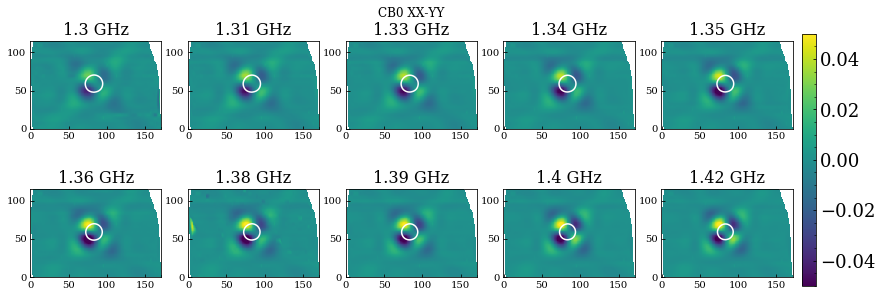

In [11]:
#for j in range(40):
for j in range(1):
    #plot_full_field('200430', j)
    #plot_full_field_xx('200430', j)
    #plot_full_field_yy('200430', j)
    #plot_full_field_dif('200430', j,'CygA')
    plot_full_field_dif('201028', j,'CasA', 'XX-YY')
    #plot_full_field_dif('190821', j,'CygA')
    #plot_full_field_dif_v2('210402', j, 'CasA')
    #plot_full_field_xx_v2('210402', j, 'CasA')
    #plot_full_field_yy_v2('210402', j, 'CasA')
    #plot_full_field_dif_abs('210402', j, 'CasA')


In [ ]:
beam = 39
date = '200130'

data = fits.getdata('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
header = fits.getheader('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']
print(data.shape)

plt.imshow(data)
plt.ylim(0,39)
plt.scatter(19,19,marker='x')

# Old beam model:

In [ ]:
data_old = fits.getdata('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
header_old = fits.getheader('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
ra, dec, cdelt1, cdelt2 = header['CRPIX1'], header['CRPIX2'], header['CDELT1'], header['CDELT2']

In [ ]:
plt.imshow(data_old)
plt.scatter(19,19,marker='x')

# Compare old and new

In [ ]:
data_old = np.flipud(data_old)

plt.imshow(data)
plt.contour(data, colors='k', levels=np.arange(0.1,1,0.1))
plt.contour(data_old, colors='grey', levels=np.arange(0.1,1,0.1))
plt.scatter(19,19,marker='x', color='r')
plt.ylim(0,39)

In [ ]:

def compare_beams(beam, date):
    data = fits.getdata('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
    header = fits.getheader('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
    data_old = fits.getdata('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))
    header_old = fits.getheader('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_5/{}_{:02}_I_model.fits'.format(date, date, beam))

    data_old = np.flipud(data_old)

    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    plt.imshow(data_old)
    plt.title(beam)
    plt.contour(data, colors='k', levels=np.arange(0.1,1,0.1))
    plt.contour(data_old, colors='grey', levels=np.arange(0.1,1,0.1))
    plt.scatter(19,19,marker='x', color='r')
    plt.savefig('/tank/denes/drift_scan/plots/{}_{}_chann_5.png'.format(date, beam), dpi=100, bbox_inches="tight")
    

In [ ]:
beam = 39
date = '200130'

for i in range(0,40):
    compare_beams(i, date)

# Compare new and old models

In [ ]:
date = '200430'
nrows = 7
ncols = 7*2+1
beams = 40


fig = plt.figure(figsize=(12,12))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig) #, width_ratios=[1]*ncols, height_ratios=[1]*nrows, wspace=0.4, hspace=0.7)

# Arrange the plots approx according to beam spacing (only beam 0 really fails)
ax = [None] * beams
for b in range(beams-1,-1,-1):
    if (b <= 39) & (b >= 33):
        ax[b] = fig.add_subplot(gs[0,2*(39-b):2*(39-b)+2])
    if (b <= 32) & (b >= 27):
        ax[b] = fig.add_subplot(gs[1,2*(32-b)+1:2*(32-b)+2+1])
    if (b <= 26) & (b >= 21):
        ax[b] = fig.add_subplot(gs[2,2*(26-b)+2:2*(26-b)+2+2])
    if (b == 0):
        ax[b] = fig.add_subplot(gs[3,2*3:2*3+2])
    if (b <= 20) & (b >= 15):
        ax[b] = fig.add_subplot(gs[4,2*(20-b)+1:2*(20-b)+2+1])
    if (b <= 14) & (b >= 8):
        ax[b] = fig.add_subplot(gs[5,2*(14-b):2*(14-b)+2])
    if (b <= 7) & (b >= 1):
        ax[b] = fig.add_subplot(gs[6,2*(7-b)+1:2*(7-b)+2+1])
    ax[b].set_xticks([])
    ax[b].set_yticks([])

    
for b in range(beams):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_7/{}_{:02}_I_model.fits'.format(date, date, b))
    hdu_old = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models_old/chann_7/{}_{:02}_I_model.fits'.format(date, date, b))

    data_old = hdu_old[0].data
    data = hdu[0].data
    data_old = np.flipud(data_old)
    c1, c2 = hdu[0].header['CRPIX1'], hdu[0].header['CRPIX2']
    c1_o, c2_o = hdu_old[0].header['CRPIX1'], hdu_old[0].header['CRPIX2']
    ax[b].imshow(data, vmin=-0.1, vmax=1.0, cmap='viridis')
    ax[b].set_title('Beam '+str(b).zfill(2))
    ax[b].scatter(c1,c2,s=2, color='k')
    ax[b].scatter(c1_o,c2_o,s=2, color='grey')
    ax[b].contour(data, levels=[0,0.2,.4,.60,.80], colors='black')
    ax[b].contour(data_old, levels=[0,0.2,.4,.60,.80], colors='grey')
    ax[b].invert_yaxis()


plt.savefig('/tank/denes/drift_scan/plots/{}_all_chann_7.png'.format(date), bbox_inches="tight", dpi=200)


# Plot all beams for a given set

In [ ]:
date = '200819'
nrows = 7
ncols = 7*2+1
beams = 40


fig = plt.figure(figsize=(12,12))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig) #, width_ratios=[1]*ncols, height_ratios=[1]*nrows, wspace=0.4, hspace=0.7)

# Arrange the plots approx according to beam spacing (only beam 0 really fails)
ax = [None] * beams
for b in range(beams-1,-1,-1):
    if (b <= 39) & (b >= 33):
        ax[b] = fig.add_subplot(gs[0,2*(39-b):2*(39-b)+2])
    if (b <= 32) & (b >= 27):
        ax[b] = fig.add_subplot(gs[1,2*(32-b)+1:2*(32-b)+2+1])
    if (b <= 26) & (b >= 21):
        ax[b] = fig.add_subplot(gs[2,2*(26-b)+2:2*(26-b)+2+2])
    if (b == 0):
        ax[b] = fig.add_subplot(gs[3,2*3:2*3+2])
    if (b <= 20) & (b >= 15):
        ax[b] = fig.add_subplot(gs[4,2*(20-b)+1:2*(20-b)+2+1])
    if (b <= 14) & (b >= 8):
        ax[b] = fig.add_subplot(gs[5,2*(14-b):2*(14-b)+2])
    if (b <= 7) & (b >= 1):
        ax[b] = fig.add_subplot(gs[6,2*(7-b)+1:2*(7-b)+2+1])
    ax[b].set_xticks([])
    ax[b].set_yticks([])

    
for b in range(beams):
    hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_7/{}_{:02}_I_model.fits'.format(date, date, b))

    data = hdu[0].data
    c1, c2 = hdu[0].header['CRPIX1'], hdu[0].header['CRPIX2']
    ax[b].imshow(data, vmin=-0.1, vmax=1.0, cmap='viridis')
    ax[b].set_title('Beam '+str(b).zfill(2))
    ax[b].scatter(c1,c2,s=2, color='k')
    ax[b].contour(data, levels=[0,0.2,.4,.60,.80], colors='black')
    ax[b].invert_yaxis()


plt.savefig('/tank/denes/drift_scan/plots/{}_all_chann_7_v0.png'.format(date), bbox_inches="tight", dpi=200)


# Test regridded maps

In [ ]:

def compare_regridded_maps(date, beam):
    hdulist_regrid = fits.open('/tank/denes/drift_scan/{}/chann_7/{}_{:02}_I_model_reg.fits'.format(date, date, beam))
    data_regrid = hdulist_regrid[0].data
    header_regrid = hdulist_regrid[0].header
    #print(data_regrid.shape)
    #print(header_regrid)

    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    plt.imshow(data_regrid)
    plt.contour(data_regrid, levels=[0.1,0.2,0.3,0.4,0.5], colors='w')
    ax.invert_yaxis()
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided.png'.format(date, beam), bbox_inches="tight", dpi=200)

    hdulist_gaus = fits.open('/tank/denes/cbeams/pb_{:02}_gpall.fits'.format(beam))
    data_gaus = hdulist_gaus[0].data
    header_gaus = hdulist_gaus[0].header

    plt.imshow(data_gaus)
    plt.contour(data_gaus, levels=[0.1,0.2,0.3,0.4,0.5], colors='w')
    #print(data_gaus.shape)
    #print(header_gaus)

    header_regrid['CRVAL1'] = header_gaus['CRVAL1']
    header_regrid['CRVAL2'] = header_gaus['CRVAL2']

    del header_gaus['CRVAL3']
    del header_gaus['CDELT3']
    del header_gaus['CTYPE3']
    del header_gaus['CRPIX3']

    del header_gaus['CRVAL4']
    del header_gaus['CDELT4']
    del header_gaus['CTYPE4']
    del header_gaus['CRPIX4']
    
    # reproject gaussian process maps
    data_reprojected, footprint = reproject_interp(hdulist_gaus, header_regrid)

    # comparison figure
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    plt.imshow(data_reprojected)
    plt.contour(data_regrid, levels=[0.1,0.2,0.3,0.4,0.5,0.9], colors='w')
    plt.contour(data_reprojected, levels=[0.1,0.2,0.3,0.4,0.5,0.9], colors='grey')
    plt.xlim(1000,2100)
    plt.ylim(1000,2100)
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_gaus.png'.format(date, beam), bbox_inches="tight", dpi=200)

    # difference figure
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    cb = plt.imshow(data_regrid/data_reprojected, vmin=0, vmax=1.1)
    plt.xlim(1000,2100)
    plt.ylim(1000,2100)

    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax, extend='both')
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    cbar.ax.set_ylabel('e$_{FWHM}$ [km s$^{-1}$]', fontsize=20)
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_gaus_v2.png'.format(date, beam), bbox_inches="tight", dpi=200)
    plt.close()


    print(np.nanmax(data_reprojected/data_regrid))

In [ ]:
for beam in range(0,40):
    compare_regridded_maps('190912', beam)


In [ ]:
def compare_maps(date, beam):
    hdulist_regrid = fits.open('/tank/apertif/driftscans/fits_files/{}/beam_models/chann_7/{}_{:02}_I_model.fits'.format(date, date, beam))
    data_regrid = hdulist_regrid[0].data
    header_regrid = hdulist_regrid[0].header
    #print(data_regrid.shape)
    
    
    #del header_regrid['CRVAL3']
    #del header_regrid['CDELT3']
    #del header_regrid['CTYPE3']
    #del header_regrid['CRPIX3']
    #del header_regrid['CUNIT3']
    #del header_regrid['*3']
    
    
    #print(header_regrid)

    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    plt.imshow(data_regrid)
    plt.contour(data_regrid, levels=[0.1,0.2,0.3,0.4,0.5], colors='w')
    ax.invert_yaxis()
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_v2.png'.format(date, beam), bbox_inches="tight", dpi=200)

    hdulist_gaus = fits.open('/tank/denes/cbeams/pb_{:02}_gpall.fits'.format(beam))
    data_gaus = hdulist_gaus[0].data
    header_gaus = hdulist_gaus[0].header

    plt.imshow(data_gaus)
    plt.contour(data_gaus, levels=[0.1,0.2,0.3,0.4,0.5], colors='w')
    #print(data_gaus.shape)
    

    header_regrid['CRVAL1'] = header_gaus['CRVAL1']
    header_regrid['CRVAL2'] = header_gaus['CRVAL2']

    #del header_gaus['CRVAL3']
    #del header_gaus['CDELT3']
    #del header_gaus['CTYPE3']
    #del header_gaus['CRPIX3']

    del header_gaus['CRVAL4']
    del header_gaus['CDELT4']
    del header_gaus['CTYPE4']
    del header_gaus['CRPIX4']
    
    #print(header_gaus)
    
    #reproject drift scan data:
    data_reprojected, footprint = reproject_interp(hdulist_regrid, header_gaus)

    # comparison figure
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    plt.imshow(data_reprojected)
    plt.contour(data_regrid, levels=[0.1,0.2,0.3,0.4,0.5,0.9], colors='w')
    plt.contour(data_reprojected, levels=[0.1,0.2,0.3,0.4,0.5,0.9], colors='grey')
    plt.xlim(1000,2100)
    plt.ylim(1000,2100)
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_gaus_v3.png'.format(date, beam), bbox_inches="tight", dpi=200)

    # difference figure
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111)
    cb = plt.imshow(data_regrid/data_reprojected, vmin=0, vmax=1.1)
    #plt.xlim(1000,2100)
    #plt.ylim(1000,2100)

    fig.subplots_adjust(right=0.94)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.015, 0.7])
    cbar =fig.colorbar(cb, cax=cbar_ax, extend='both')
    cbar.minorticks_on()
    cbar.ax.tick_params(labelsize=18) 
    cbar.ax.set_ylabel('e$_{FWHM}$ [km s$^{-1}$]', fontsize=20)
    plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_gaus_v4.png'.format(date, beam), bbox_inches="tight", dpi=200)
    plt.close()

    print(np.nanmax(data_reprojected/data_regrid))

In [ ]:
compare_maps('190628', 1)

# Compare to GP beams
- there is also a separate notebook for this section that has better plots

In [ ]:
#all beams gaussian comparison

date = '200130'
nrows = 7
ncols = 7*2+1
beams = 40


fig = plt.figure(figsize=(12,12))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig) #, width_ratios=[1]*ncols, height_ratios=[1]*nrows, wspace=0.4, hspace=0.7)

# Arrange the plots approx according to beam spacing (only beam 0 really fails)
ax = [None] * beams
for b in range(beams-1,-1,-1):
    if (b <= 39) & (b >= 33):
        ax[b] = fig.add_subplot(gs[0,2*(39-b):2*(39-b)+2])
    if (b <= 32) & (b >= 27):
        ax[b] = fig.add_subplot(gs[1,2*(32-b)+1:2*(32-b)+2+1])
    if (b <= 26) & (b >= 21):
        ax[b] = fig.add_subplot(gs[2,2*(26-b)+2:2*(26-b)+2+2])
    if (b == 0):
        ax[b] = fig.add_subplot(gs[3,2*3:2*3+2])
    if (b <= 20) & (b >= 15):
        ax[b] = fig.add_subplot(gs[4,2*(20-b)+1:2*(20-b)+2+1])
    if (b <= 14) & (b >= 8):
        ax[b] = fig.add_subplot(gs[5,2*(14-b):2*(14-b)+2])
    if (b <= 7) & (b >= 1):
        ax[b] = fig.add_subplot(gs[6,2*(7-b)+1:2*(7-b)+2+1])
    ax[b].set_xticks([])
    ax[b].set_yticks([])

    
for b in range(beams):
    hdulist_regrid = fits.open('/tank/denes/drift_scan/{}_{:02}_I_model_recent_regrid.fits'.format(date, b))
    data_regrid = hdulist_regrid[0].data
    header_regrid = hdulist_regrid[0].header
    
    hdulist_gaus = fits.open('/tank/denes/cbeams/pb_{:02}_gpall.fits'.format(b))
    data_gaus = hdulist_gaus[0].data
    header_gaus = hdulist_gaus[0].header

    header_regrid['CRVAL1'] = header_gaus['CRVAL1']
    header_regrid['CRVAL2'] = header_gaus['CRVAL2']

    del header_gaus['CRVAL3']
    del header_gaus['CDELT3']
    del header_gaus['CTYPE3']
    del header_gaus['CRPIX3']

    del header_gaus['CRVAL4']
    del header_gaus['CDELT4']
    del header_gaus['CTYPE4']
    del header_gaus['CRPIX4']
    
    # reproject gaussian process maps
    data_reprojected, footprint = reproject_interp(hdulist_gaus, header_regrid)
    
    #c1, c2 = hdu[0].header['CRPIX1'], hdu[0].header['CRPIX2']
    #c1_o, c2_o = hdu_old[0].header['CRPIX1'], hdu_old[0].header['CRPIX2']
    ax[b].imshow(data_regrid, vmin=-0.1, vmax=1.0, cmap='viridis')
    ax[b].set_title('Beam '+str(b).zfill(2))
    #ax[b].scatter(c1,c2,s=2, color='k')
    #ax[b].scatter(c1_o,c2_o,s=2, color='grey')
    ax[b].contour(data_regrid, levels=[0,0.2,.4,.60,.80], colors='black')
    ax[b].contour(data_gaus, levels=[0,0.2,.4,.60,.80], colors='grey')
    ax[b].invert_yaxis()
    #ax[b].xlim(1000,2100)
    #ax[b].ylim(1000,2100)


plt.savefig('/tank/denes/drift_scan/plots/{}_all_chann_7_gauss.png'.format(date), bbox_inches="tight", dpi=200)


In [ ]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
plt.plot(data_regrid,data_reprojected, 'o')
plt.show()
#plt.xlim(1000,2100)
#plt.ylim(1000,2100)
#plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chann_7_regrided_gaus_v2.png'.format(date, beam), bbox_inches="tight", dpi=200)


In [ ]:
header_old = fits.getheader('/tank/denes/drift_scan/200130/cube0/200130_00_I_model_reg.fits')
print(header_old )

In [ ]:
date = '190912'
beam = 1

hdulist = fits.open('/tank/denes/drift_scan/{}/chann_7/{}_{:02}_I_model_reg.fits'.format(date, date, beam))
data_regrid = hdulist[0].data

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
plt.imshow(data_regrid)
plt.contour(data_regrid, levels=[0.1,0.2,0.3,0.4,0.5], colors='w')
ax.set_xlabel('pixel', size=20)
ax.set_ylabel('pixel', size=20)
plt.xlim(0,3073)
plt.ylim(0,3073)
plt.savefig('/tank/denes/drift_scan/plots/{}_{:02}_chan_7_regrided.png'.format(date, beam), bbox_inches="tight", dpi=200)


# Test antennas

In [ ]:
# Plot beam maps from each antenna and each channel

date = '201028'
ant_names = ['RT2', 'RT3', 'RT4', 'RT5', 'RT6', 'RT7', 'RT8', 'RT9', 'RTA', 'RTB','RTC', 'RTD']

freq_label = np.array([1234867750.0, 1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0, 1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0])
freq_label_gh = np.round(freq_label/1e9,2)

def plot_antenna_maps(date, ant):
    nrows = 7
    ncols = 7*2+1
    beams = 40
    
    for chan in range(10):
        fig = plt.figure(figsize=(12,12))
        gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, figure=fig) #, width_ratios=[1]*ncols, height_ratios=[1]*nrows, wspace=0.4, hspace=0.7)

        # Arrange the plots approx according to beam spacing (only beam 0 really fails)
        ax = [None] * beams
        for b in range(beams-1,-1,-1):
            if (b <= 39) & (b >= 33):
                ax[b] = fig.add_subplot(gs[0,2*(39-b):2*(39-b)+2])
            if (b <= 32) & (b >= 27):
                ax[b] = fig.add_subplot(gs[1,2*(32-b)+1:2*(32-b)+2+1])
            if (b <= 26) & (b >= 21):
                ax[b] = fig.add_subplot(gs[2,2*(26-b)+2:2*(26-b)+2+2])
            if (b == 0):
                ax[b] = fig.add_subplot(gs[3,2*3:2*3+2])
            if (b <= 20) & (b >= 15):
                ax[b] = fig.add_subplot(gs[4,2*(20-b)+1:2*(20-b)+2+1])
            if (b <= 14) & (b >= 8):
                ax[b] = fig.add_subplot(gs[5,2*(14-b):2*(14-b)+2])
            if (b <= 7) & (b >= 1):
                ax[b] = fig.add_subplot(gs[6,2*(7-b)+1:2*(7-b)+2+1])
            ax[b].set_xticks([])
            ax[b].set_yticks([])


        for b in range(beams):
            hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/ant_{}/beam_models/{}_{:02}_I_model.fits'.format(date, ant, date, b))

            data = hdu[0].data
            data = data[chan,:,:]
            c1, c2 = hdu[0].header['CRPIX1'], hdu[0].header['CRPIX2']
            ax[b].imshow(data, cmap='viridis', vmin=0, vmax=1)
            ax[b].set_title('Beam '+str(b).zfill(2))
            ax[b].scatter(c1,c2,s=2, color='k')
            ax[b].contour(data, levels=[0,0.2,.4,.60,.80], colors='w')
            #ax[b].invert_yaxis()

        #fig.suptitle("Beam maps {} {} GHz ant {}".format(date, freq_label_gh[chan], ant+1), size=18)
        fig.suptitle("Beam maps {} {} GHz {}".format(date, freq_label_gh[chan], ant_names[ant]), size=18)
        plt.savefig('/tank/denes/drift_scan/plots/{0}/{0}_chan{1}_ant_{2}.png'.format(date, chan, ant), bbox_inches="tight", dpi=200)


In [ ]:
# date = '201028' 
date = '190821' # has all 12 antennas
#date = '200430'
#date = '201009'
antennas = range(12)

for ant in antennas:
    plot_antenna_maps(date, ant)

# Calculate peak intensity for each beam per antenna

In [ ]:
# get position shift:

hdu = fits.open('/tank/apertif/driftscans/fits_files/{}/ant_{}/beam_models/{}_{:02}_I_model.fits'.format(date, ant, date, b))
data = hdu[0].data


In [ ]:
# plot position angle for all beams at different frequencies

#dates = ['190628', '190722', '190821', '190826', '190912', '190916', '190918', '191008', '191023', '191026', '191120', '200130', '200430', '200710', '200819', '201009', '201028', '201218']
date = '190821'
freq_label = np.array([1234867750.0, 1253178250.0, 1271488750.0, 1289799250.0, 1308109750.0, 1326420250.0, 1344730750.0, 1363041250.0, 1381351750.0, 1399662250.0])
freq_label_gh = np.round(freq_label/1e9,2)

n = 9
colors = mpl.cm.Blues(np.linspace(0,1,n))

for date in dates:
    fig = plt.figure( figsize=(12, 8))
    ax = fig.add_subplot(211)
    ax.set_title(date, fontsize=18)
    for freq in range(1,10):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        x_off = (20-data['x_0'])*(100. / 3600.)
        ax.scatter(range(40), x_off, label='{} GHz'.format(freq_label_gh[freq]), color=colors[freq])

    ax.scatter(range(40), x_off_gp, label='GP', color='red')
    ax.set_ylabel('X offset [deg]', fontsize=20)
    #ax.set_xlabel('Beams', fontsize=20)
    ax.set_ylim(-0.25,0.25)
    #ax.set_ylim(-0.6,0.6)
    ax.legend(bbox_to_anchor=(1.03, 1.05)) 
    plt.grid(linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
    ax = fig.add_subplot(212)
    for freq in range(1,10):
        data = ascii.read('/tank/apertif/driftscans/fits_files/{}/beam_FWHM_{}_I_{}.csv'.format(date, date, freq), format='csv', fast_reader=False)
        y_off = (20-data['y_0'])*(100. / 3600.)
        ax.scatter(range(40), y_off, label=freq, color=colors[freq])

    ax.scatter(range(40), y_off_gp, label='GP', color='red')
    ax.set_ylabel('Y offset [deg]', fontsize=20)
    ax.set_xlabel('Beams', fontsize=20)
    ax.set_ylim(-0.25,0.25)
    #ax.set_ylim(-0.6,0.6)
    plt.grid(linestyle='--', alpha=0.5)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
    plt.savefig('/tank/denes/drift_scan/plots/{}_xy_off_gp.png'.format(date), bbox_inches="tight", dpi=200)
